#Mapa de calor

In [ ]:
!pip install wquantiles

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names

--2023-04-25 15:18:02--  https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3974305 (3.8M) [application/x-httpd-php]
Saving to: ‘adult.data’

adult.data          100%[===================>]   3.79M  3.17MB/s    in 1.2s    

2023-04-25 15:18:04 (3.17 MB/s) - ‘adult.data’ saved [3974305/3974305]

--2023-04-25 15:18:04--  https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5229 (5.1K) [application/x-httpd-php]
Saving to: ‘adult.names’

adult.names         100%[===================>]   5.11K  --.-KB/s    in 0s      

2023-

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import trim_mean
from statsmodels import robust
import wquantiles

import seaborn as sns
import matplotlib.pylab as plt

In [ ]:
#url  = "https://raw.githubusercontent.com/gedeck/practical-statistics-for-data-scientists/master/data/state.csv"

In [ ]:
census = pd.read_csv("/content/adult.data")
census.columns=["age","workclass","fnlwgt","education","education-num","marital-status","occupation","relationship","race","sex","capital-gain","capital-loss","hours-per-week","native-country","gain"]
census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,gain
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [ ]:
#Media
census["age"].mean()

38.581633906633904

In [ ]:
#media de la matriz, despues de recortar las colas de la distribución
#En este caso corta  0.1 o sea 10% de ambos lados de la distribución 
trim_mean(census["age"],  0.1)

37.68976504914005

In [ ]:
#Mediana
census["age"].median()

37.0

In [ ]:
#Cadena de promedio
np.average(census["age"])

38.581633906633904

In [ ]:
#Desviación estandar
census["age"].std()

13.64064182746401

In [ ]:
#Valores medios quitando el primer y el cuarto cuantil
census["age"].quantile(0.75)-census["age"].quantile(0.25)

20.0

In [ ]:
census["age"].quantile([0.05, 0.25, 0.5, 0.75, 0.95])

0.05    19.0
0.25    28.0
0.50    37.0
0.75    48.0
0.95    63.0
Name: age, dtype: float64

In [ ]:
percentages = [0.05, 0.25, 0.5, 0.75, 0.95]

df = pd.DataFrame(census["age"].quantile(percentages))
df.index = [f"{p*100}%" for p in percentages]
df.transpose()

,5.0%,25.0%,50.0%,75.0%,95.0%
age,19.0,28.0,37.0,48.0,63.0


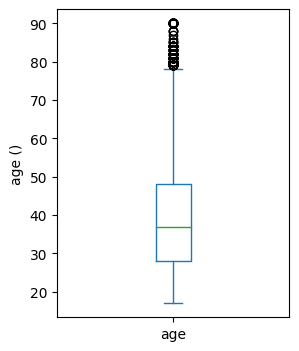

In [ ]:
#(census["age"]/1) aqui la división en uno es la base en que se mostrarán los resultados en el eje Y de age
#plot.box(figsize=(3, 4)) este dibuja el box plot en un tamaño de 3x4
ax = (census["age"]/1).plot.box(figsize=(3, 4))
ax.set_ylabel("age ()")

plt.show()

In [ ]:
#Segmenta los datos en 10 grupos de rangos de edad :D
binnedAge = pd.cut(census["age"], 10)
#binnedAge.value_counts() muestra de forma ordenada los grupos con la cantidad de valores que tienen
#serían entonces      "[rango de edad]      cantidad"  
binnedAge.value_counts()

(38.9, 46.2]      6162
(31.6, 38.9]      6048
(24.3, 31.6]      5890
(16.927, 24.3]    5570
(46.2, 53.5]      3967
(53.5, 60.8]      2591
(60.8, 68.1]      1595
(68.1, 75.4]       496
(75.4, 82.7]       174
(82.7, 90.0]        67
Name: age, dtype: int64

In [ ]:
#Concatenos a nuestro dataframe "binnedAge", que son las edades agrupadas o categorizadas podríamos decir 
binnedAge.name = "binnedAge"
df = pd.concat([census, binnedAge], axis=1)
df = df.sort_values(by="age")
df

In [ ]:
groups = []
for group, subset in df.groupby(by="binnedAge"):
    groups.append({
        "BinRange": group,
        "Count": len(subset),
        "States": ",".join(subset.relationship)
    })
pd.DataFrame(groups)

,BinRange,Count,States
0,"(16.927, 24.3]",5570,"Own-child, Own-child, Own-child, Own-child, O..."
1,"(24.3, 31.6]",5890,"Own-child, Not-in-family, Husband, Unmarried,..."
2,"(31.6, 38.9]",6048,"Own-child, Own-child, Wife, Husband, Unmarrie..."
3,"(38.9, 46.2]",6162,"Husband, Unmarried, Own-child, Unmarried, Not..."
4,"(46.2, 53.5]",3967,"Husband, Husband, Husband, Unmarried, Husband..."
5,"(53.5, 60.8]",2591,"Husband, Husband, Unmarried, Husband, Unmarri..."
6,"(60.8, 68.1]",1595,"Unmarried, Other-relative, Husband, Unmarried..."
7,"(68.1, 75.4]",496,"Husband, Unmarried, Unmarried, Not-in-family,..."
8,"(75.4, 82.7]",174,"Not-in-family, Not-in-family, Not-in-family, ..."
9,"(82.7, 90.0]",67,"Husband, Not-in-family, Not-in-family, Not-in..."


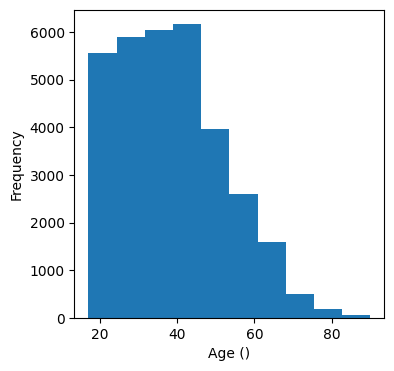

In [ ]:
ax = (census["age"] / 1).plot.hist(figsize=(4, 4))
ax.set_xlabel("Age ()")

plt.show()

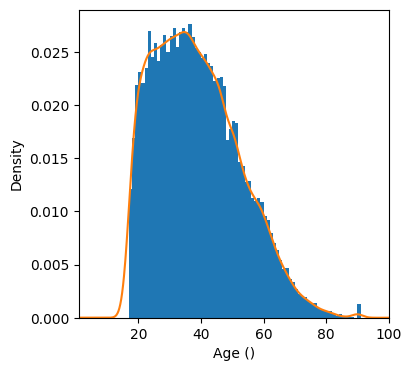

In [ ]:
ax = (census["age"] / 1).plot.hist(density=True, xlim=[1, 100],
                                    bins=range(1, 100),figsize=(4, 4))
census["age"].plot.density(ax=ax)
ax.set_xlabel("Age ()")

plt.show()

In [ ]:
census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,gain
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


<ipython-input-51-55796564c249>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax = sns.heatmap(census.corr(), vmin=-1, vmax=1,


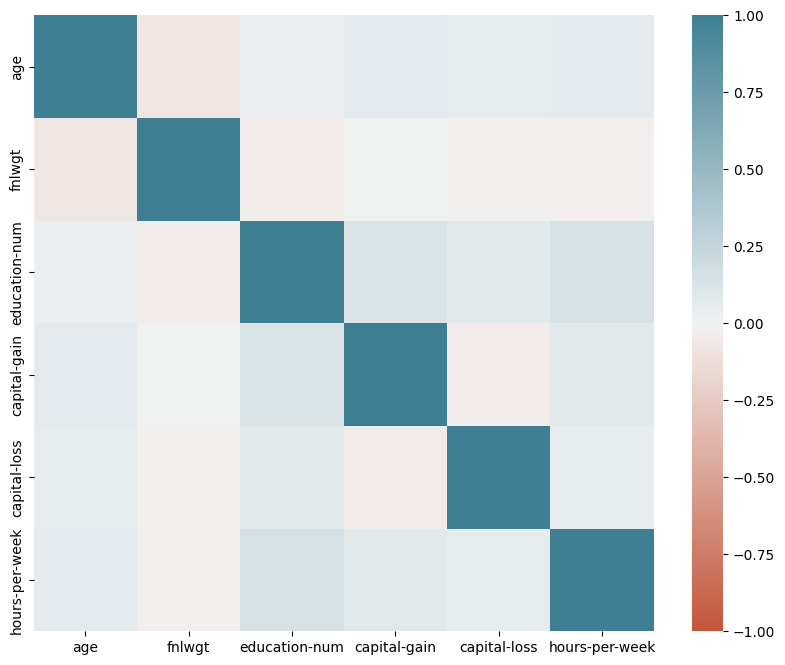

In [ ]:
#Solo toma valores numericos para realizar le mapa de calor
fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(census.corr(), vmin=-1, vmax=1,
                 cmap=sns.diverging_palette(20, 220, as_cmap=True),
                 ax=ax)

plt.show()

#Grados en entrenamiento

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

In [ ]:
np.random.seed(1981)

n_samples = 30
degrees = [1, 15, 3, 5]

true_fun = lambda X: np.cos(1.5 * np.pi * X)
X = np.sort(np.random.rand(n_samples))
y = true_fun(X) + np.random.randn(n_samples)*0.1


#np.random.randn(n_samples)*0.1 realiza un pequeño ruido


print(X)
print(y)

[0.02385472 0.0689     0.11451939 0.13233723 0.20414244 0.21388575
 0.25024219 0.26865344 0.28499548 0.31432598 0.36140032 0.38409571
 0.40513121 0.40721321 0.55448686 0.60550542 0.60892626 0.62338562
 0.65986813 0.67518306 0.72107481 0.73214605 0.78411895 0.86101857
 0.88559097 0.88654022 0.9262294  0.93152379 0.94146993 0.97341551]
[ 1.06325417  0.94955282  0.95689539  0.8040319   0.52384314  0.64719834
  0.49755715  0.31460681  0.05479708  0.15530579 -0.10798829 -0.12430512
 -0.30175409 -0.46843211 -0.86350937 -0.88203305 -0.97826894 -0.88081571
 -1.06542333 -1.12229818 -0.9667984  -0.98205911 -0.78163116 -0.4310119
 -0.47200009 -0.43398333 -0.27498994 -0.23807591 -0.33166318 -0.2000986 ]


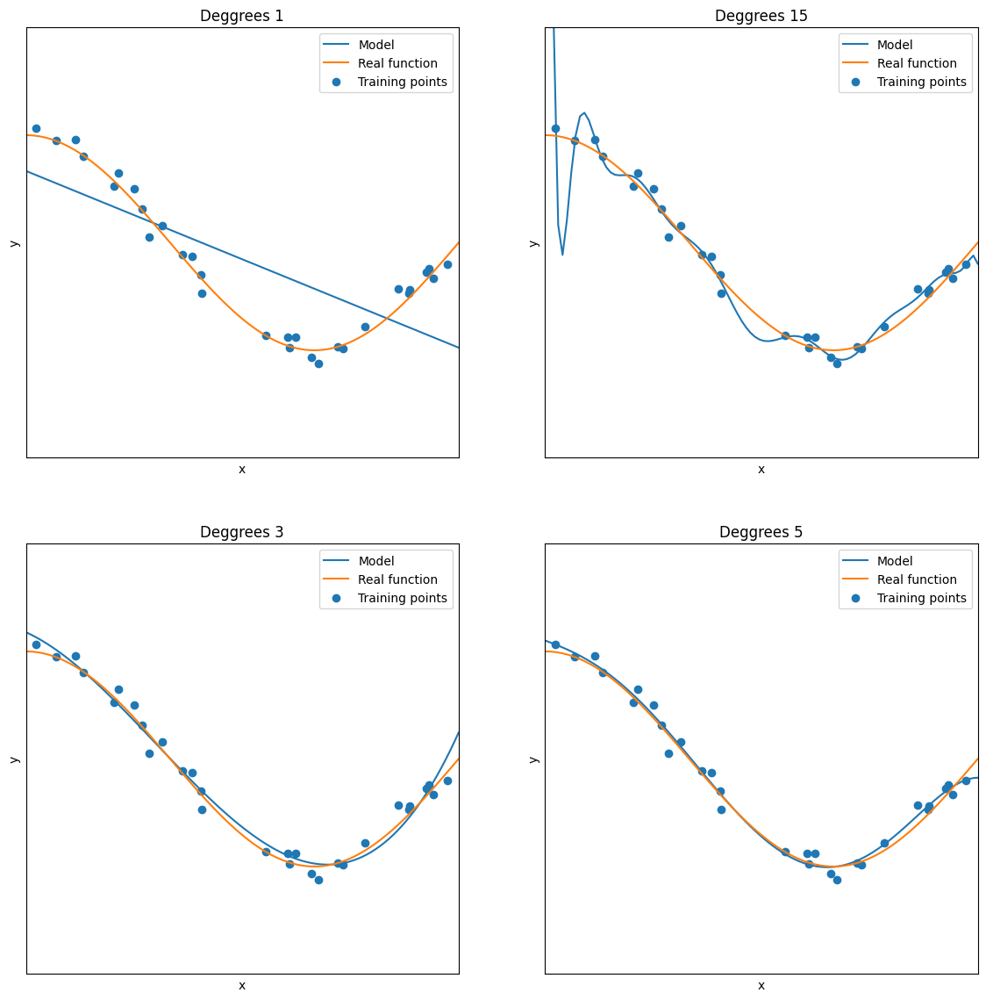

In [ ]:
plt.figure(figsize=(14, 14))

X_test = np.linspace(0, 1, 100)

for i, degree in enumerate(degrees):
    ax = plt.subplot(2, 2, i + 1)
    plt.setp(ax, xticks=(), yticks=())

    polynomial_features = PolynomialFeatures(degree=degree,
                                             include_bias=False)
    linear_regression = LinearRegression()
    pipeline = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    pipeline.fit(X[:, np.newaxis], y)

    plt.plot(X_test, pipeline.predict(X_test[:, np.newaxis]), label="Model")
    plt.plot(X_test, true_fun(X_test), label="Real function")
    plt.scatter(X, y, label="Training points")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.xlim((0, 1))
    plt.ylim((-2, 2))
    plt.legend(loc="best")
    plt.title(f"Deggrees {degree}")

plt.show()

#Regresión Logistica

In [ ]:
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names

--2023-04-27 16:26:03--  https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3974305 (3.8M) [application/x-httpd-php]
Saving to: ‘adult.data’

adult.data          100%[===================>]   3.79M  7.39MB/s    in 0.5s    

2023-04-27 16:26:04 (7.39 MB/s) - ‘adult.data’ saved [3974305/3974305]

--2023-04-27 16:26:04--  https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5229 (5.1K) [application/x-httpd-php]
Saving to: ‘adult.names’

adult.names         100%[===================>]   5.11K  --.-KB/s    in 0s      

2023-

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import pandas as pd

In [ ]:
census = pd.read_csv("/content/adult.data") 
census.columns=["age","workclass","fnlwgt","education","education-num","marital-status","occupation","relationship","race","sex","capital-gain","capital-loss","hours-per-week","native-country","gain"]
census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,gain
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


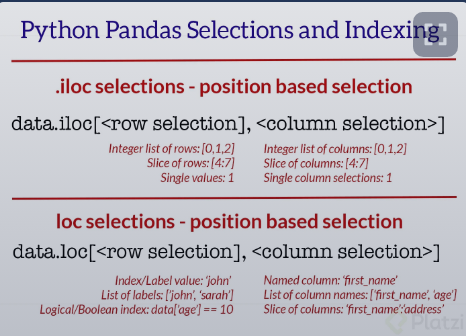

In [ ]:
#Filtrar valores de filas
census.loc[census["gain"]!=" <=50K",]

In [ ]:
#Filtrar por columnas
census.loc[:,"age":"native-country"]

In [ ]:
census.dtypes

age                int64
workclass         object
fnlwgt             int64
education         object
education-num      int64
marital-status    object
occupation        object
relationship      object
race              object
sex               object
capital-gain       int64
capital-loss       int64
hours-per-week     int64
native-country    object
gain              object
dtype: object

In [ ]:
X = census.loc[:,["age","fnlwgt","education-num","capital-gain","capital-loss","hours-per-week"]]
y = census.loc[:,"gain"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)

In [ ]:
print(len(X_train),len( X_test),len( y_train),len(y_test))

19536 13024 19536 13024


In [ ]:
clf=LogisticRegression(random_state=0).fit(X_train,y_train)
y_hat=clf.predict(X_test)
print(y_hat)
print(y_test==y_hat)

[' <=50K' ' <=50K' ' <=50K' ... ' <=50K' ' <=50K' ' <=50K']
22278    False
8950      True
7838      True
16505     True
19140     True
         ...  
12444    False
19389     True
19762    False
22817     True
10046    False
Name: gain, Length: 13024, dtype: bool


In [ ]:
clf.predict_proba(X_test)

array([[0.79325669, 0.20674331],
       [0.80262709, 0.19737291],
       [0.7894063 , 0.2105937 ],
       ...,
       [0.81274456, 0.18725544],
       [0.64744022, 0.35255978],
       [0.86473835, 0.13526165]])

In [ ]:
#VARIANZA

acc_val=clf.score(X_test,y_test)
acc_val

0.7990632678132679

In [ ]:
acc_train=clf.score(X_train,y_train)
acc_train

0.7957616707616708

In [ ]:
(acc_train-acc_val)*100

-0.33015970515970494

#Support Vector Machine

In [ ]:
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names

--2023-05-10 23:58:38--  https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3974305 (3.8M) [application/x-httpd-php]
Saving to: ‘adult.data’

adult.data          100%[===================>]   3.79M  7.14MB/s    in 0.5s    

2023-05-10 23:58:39 (7.14 MB/s) - ‘adult.data’ saved [3974305/3974305]

--2023-05-10 23:58:39--  https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5229 (5.1K) [application/x-httpd-php]
Saving to: ‘adult.names’

adult.names         100%[===================>]   5.11K  --.-KB/s    in 0s      

2023-

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.svm import SVC

In [ ]:
census = pd.read_csv("/content/adult.data") 
census.columns=["age","workclass","fnlwgt","education","education-num","marital-status","occupation","relationship","race","sex","capital-gain","capital-loss","hours-per-week","native-country","gain"]
census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,gain
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [ ]:
X = census.loc[:,["age","fnlwgt","education-num","capital-gain","capital-loss","hours-per-week"]]
y = census.loc[:,"gain"]
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.4, random_state=0)

In [ ]:
#Pipeline une dos funciones como una sola, en la manera de concatenar
#StandarScaler, es necesario como un preprocesamiento de los datos antes de 
#pasar al modelo  SVM 
#La estandarización de un conjunto de datos es un requisito común para muchos 
#Estimadores de aprendizaje automático: podrían comportarse mal si el Las 
#características individuales no se ven más o menos como estándar normalmente 
#datos distribuidos (por ejemplo, gaussiano con media 0 y varianza unitaria).

clf = make_pipeline(StandardScaler(), SVC(gamma="auto"))
clf.fit(X_train,y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(gamma='auto'))])

In [ ]:
#Accuracy en training

acc_train = clf.score(X_train, y_train)
acc_train

0.8277027027027027

In [ ]:
#Accuracy en test
acc_val = clf.score(X_test, y_test)
acc_val

0.8224047911547911

In [ ]:
#Varianza
(acc_val-acc_train)*100
#Tenemos 5% de diferencia, tenemos overfiting

-0.5297911547911593

#ARBOL DE DESICIONES

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn import tree
import pandas as pd

In [ ]:
census = pd.read_csv("/content/adult.data") 
census.columns=["age","workclass","fnlwgt","education","education-num","marital-status","occupation","relationship","race","sex","capital-gain","capital-loss","hours-per-week","native-country","gain"]
census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,gain
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [ ]:
X = census.loc[:,["age","fnlwgt","education-num","capital-gain","capital-loss","hours-per-week"]]
y = census.loc[:,"gain"]
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.4, random_state=0)

In [ ]:
#Creamos el modelo de Decision Tree
clf = tree.DecisionTreeClassifier()
#Entrenamos el modelo con los datos de entrada
clf = clf.fit(X_train, y_train)

In [ ]:
y_hat = clf.predict(X_test)

In [ ]:
print(y_hat==y_test)

22278    False
8950      True
7838      True
16505     True
19140     True
         ...  
12444     True
19389     True
19762     True
22817     True
10046    False
Name: gain, Length: 13024, dtype: bool


In [ ]:
#El coeficiente R cuadrado de la linea recta
#Bias
acc_train = clf.score(X_train,y_train)
acc_train

0.9992833742833743

In [ ]:
#Varianza
#Test Accuracy
acc_val = clf.score(X_test, y_test)
acc_val

0.7644348894348895

In [ ]:
(acc_val - acc_train) * 100

-23.484848484848484

In [ ]:
#tree.plot_tree(clf)

In [ ]:
 import graphviz
# dot_data = tree.export_graphviz(clf, out_file=None)
# graphviz.Source(dot_data)

In [ ]:
dot_data = tree.export_graphviz(clf, out_file=None,
                                feature_names=["age","fnlwgt","education-num","capital-gain","capital-loss","hours-per-week"],
                                filled=True, rounded=True,
                                special_characters=True)
graphviz.Source(dot_data)
#Ginni ayuda a medir la relevancia de cada columna con respecto a la clase, es decir cual tiene más influencia en la clase, para que la columna con más influencia se pueda  utilizar como la raiz

#Naive Bayes

In [ ]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes  import GaussianNB

In [ ]:
census = pd.read_csv("/content/adult.data") 
census.columns=["age","workclass","fnlwgt","education","education-num","marital-status","occupation","relationship","race","sex","capital-gain","capital-loss","hours-per-week","native-country","gain"]
census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,gain
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [ ]:
X = census.loc[:,["age","fnlwgt","education-num","capital-gain","capital-loss","hours-per-week"]]
y = census.loc[:,"gain"]
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.4, random_state=0)

In [ ]:
clf = GaussianNB()
clf.fit(X_train, y_train)

GaussianNB()

In [ ]:
#Bias
#R cuadrado
acc_train = clf.score(X_train, y_train)
acc_train

0.7926392301392301

In [ ]:

#test accuracy
acc_val = clf.score(X_test, y_test)
acc_val

0.7977579852579852

In [ ]:
#varianza
(acc_val - acc_train)*100

0.5118755118755147

#NAIVE BAYES

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes  import GaussianNB

In [ ]:
import urllib.request
import os
import gzip
import numpy as np

def download_mnist():
    base_url = 'yann.lecun.com/exdb/mnist/'
    file_names = ['train-images-idx3-ubyte.gz', 'train-labels-idx1-ubyte.gz',
                  't10k-images-idx3-ubyte.gz', 't10k-labels-idx1-ubyte.gz']
    data_dir = './data/mnist'

    if not os.path.exists(data_dir):
        os.makedirs(data_dir)

    for file_name in file_names:
        file_path = os.path.join(data_dir, file_name)
    if not os.path.exists(file_path):
        file_url = base_url + file_name
        print('Downloading', file_url)
        urllib.request.urlretrieve(file_url, file_path)

def load_mnist():
    data_dir = './data/mnist'

    # Load training images
    with gzip.open(os.path.join(data_dir, 'train-images-idx3-ubyte.gz'), 'rb') as f:
        train_images = np.frombuffer(f.read(), np.uint8, offset=16).reshape(-1, 28, 28)

    # Load training labels
    with gzip.open(os.path.join(data_dir, 'train-labels-idx1-ubyte.gz'), 'rb') as f:
        train_labels = np.frombuffer(f.read(), np.uint8, offset=8)

    # Load test images
    with gzip.open(os.path.join(data_dir, 't10k-images-idx3-ubyte.gz'), 'rb') as f:
        test_images = np.frombuffer(f.read(), np.uint8, offset=16).reshape(-1, 28, 28)

    # Load test labels
    with gzip.open(os.path.join(data_dir, 't10k-labels-idx1-ubyte.gz'), 'rb') as f:
        test_labels = np.frombuffer(f.read(), np.uint8, offset=8)

    return train_images, train_labels, test_images, test_labels

# Download the dataset if not present
# download_mnist()

# Load the dataset
train_images, train_labels, test_images, test_labels = load_mnist()

#Fashion MNIST

In [ ]:
!pip install wget

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=2bacd876cd367d49402c734d14e2b0f735c36eed6f168f5cc1956666184d8146
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes  import GaussianNB

In [ ]:
import wget
import gzip
import numpy as np

# URL del archivo que contiene los datos de entrenamiento y prueba
url_train_images = 'http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/train-images-idx3-ubyte.gz'
url_train_labels = 'http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/train-labels-idx1-ubyte.gz'
url_test_images = 'http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/t10k-images-idx3-ubyte.gz'
url_test_labels = 'http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/t10k-labels-idx1-ubyte.gz'

# Descargar los archivos de datos
wget.download(url_train_images, 'train-images.gz')
wget.download(url_train_labels, 'train-labels.gz')
wget.download(url_test_images, 'test-images.gz')
wget.download(url_test_labels, 'test-labels.gz')

# Cargar los datos de entrenamiento y prueba
with gzip.open('train-images.gz', 'rb') as f:
    train_images = np.frombuffer(f.read(), np.uint8, offset=16).reshape(-1, 28, 28)
with gzip.open('train-labels.gz', 'rb') as f:
    train_labels = np.frombuffer(f.read(), np.uint8, offset=8)
with gzip.open('test-images.gz', 'rb') as f:
    test_images = np.frombuffer(f.read(), np.uint8, offset=16).reshape(-1, 28, 28)
with gzip.open('test-labels.gz', 'rb') as f:
    test_labels = np.frombuffer(f.read(), np.uint8, offset=8)

# Imprimir el tamaño del conjunto de datos de entrenamiento y prueba
print("Tamaño del conjunto de datos de entrenamiento:", train_images.shape)
print("Tamaño del conjunto de datos de prueba:", test_images.shape)

Tamaño del conjunto de datos de entrenamiento: (60000, 28, 28)
Tamaño del conjunto de datos de prueba: (10000, 28, 28)


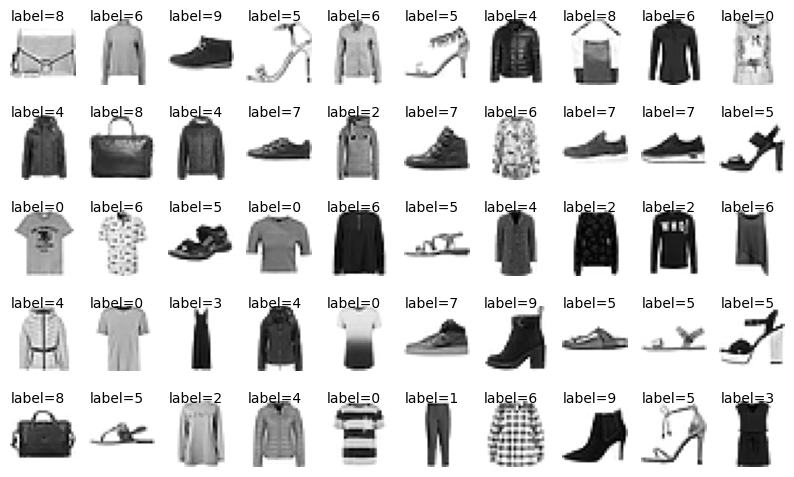

In [ ]:
fig, axs = plt.subplots(5, 10, figsize=(10, 6))
for i in range(5):
    for j in range(10):
        idx = random.randint(0, 60000)
        axs[i, j].imshow(train_images[idx], cmap="gray_r")
        axs[i, j].axis("off")
        axs[i, j].text(0, 0, f"label={train_labels[idx]}")
plt.show()

In [ ]:
X_train, X_test, y_train, y_test = train_images, test_images, train_labels, test_labels
X_train = X_train.reshape(-1, 28 * 28)
X_test = X_test.reshape(-1, 28 * 28)

In [ ]:
X_train.shape

(60000, 784)

In [ ]:
clf = GaussianNB()
clf.fit(X_train, y_train)

GaussianNB()

In [ ]:
#BIAS
#R^2
acc_train = clf.score(X_train, y_train)
acc_train

0.5877833333333333

In [ ]:
#Test accuracy
acc_val = clf.score(X_test, y_test)
acc_val

0.5856

In [ ]:
#Varianza
(acc_val - acc_train) * 100

-0.2183333333333315

In [ ]:
#Hacemos un descomposición
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=100)
pca.fit(X_train)

PCA(n_components=100)

In [ ]:
pca.explained_variance_ratio_

array([0.29039228, 0.1775531 , 0.06019222, 0.04957428, 0.03847655,
       0.03460769, 0.02341691, 0.01905414, 0.01349843, 0.01314267,
       0.00992875, 0.00913255, 0.00765793, 0.00659706, 0.00607851,
       0.00589821, 0.00551934, 0.005245  , 0.00458079, 0.00455515,
       0.00433684, 0.00407097, 0.00384758, 0.00372551, 0.00361107,
       0.00350656, 0.00333241, 0.0031936 , 0.00308063, 0.00293273,
       0.00275603, 0.00265062, 0.00263703, 0.00255835, 0.00246212,
       0.00235901, 0.00230289, 0.00225522, 0.00218475, 0.00209322,
       0.00200281, 0.00195738, 0.00194686, 0.00182778, 0.00175348,
       0.00171917, 0.00168776, 0.00163967, 0.00160886, 0.00154838,
       0.00152277, 0.00150034, 0.0014677 , 0.00143286, 0.00138248,
       0.00136969, 0.00131096, 0.00128829, 0.00127193, 0.00125785,
       0.00121386, 0.0012015 , 0.00118039, 0.0011614 , 0.00115514,
       0.00112219, 0.00110795, 0.00109573, 0.00104867, 0.00104558,
       0.00102986, 0.00100808, 0.00097567, 0.00095341, 0.00093

In [ ]:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
clf = GaussianNB()
clf.fit(X_train_pca, y_train)

GaussianNB()

In [ ]:
#Bias
acc_train = clf.score(X_train_pca, y_train)
acc_train

0.7713833333333333

In [ ]:
#Test Accuracy
acc_val = clf.score(X_test_pca, y_test)
acc_val

0.7594

In [ ]:
#Varianza
(acc_val - acc_train) * 100

-1.1983333333333346

#REDES NEURONALES

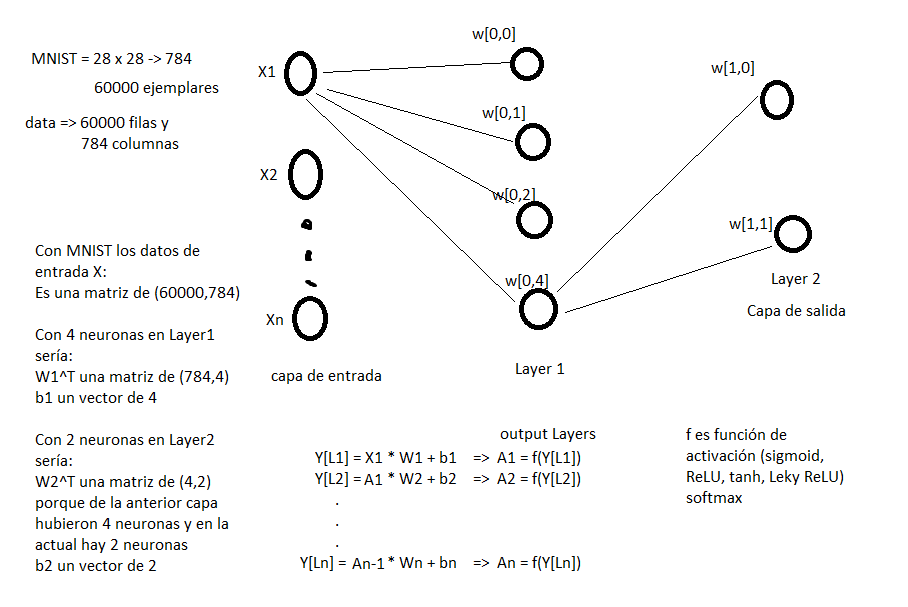

In [ ]:
#Cuantos parametros tiene la red neuronal si se utiliza MNIST como datos de entrada?
#MNIST son imagenes de 28 x 28 que convertido a vector sería de 784
#Para la red neuronal con
#2 capas ocultas(128 neuronas y 64 neuronas)
#1 capa de salida(10 neuronas)

#Calculando parametros...
#L1=784 * 128 + 128 = 100480
#L2=128 * 64 + 64 = 8256
#LSalida=64 * 10 + 10 = 650

#Sumamos = 109386

## Multiclass Classification

In [ ]:
import numpy as np
from tensorflow import keras
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import random

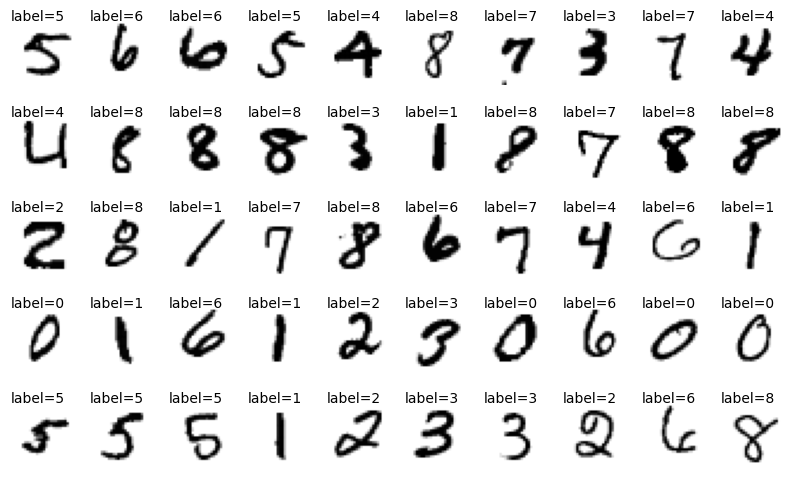

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()
x_train = x_train / 255.
x_test = x_test / 255.

fig, axs = plt.subplots(5, 10, figsize=(10,6))
m = x_train.shape[0]
for i in range(5):
    for j in range(10):
        idx = random.randint(0,m)
        axs[i,j].imshow(x_train[idx], cmap="gray_r")
        axs[i,j].axis("off")
        axs[i,j].text(0,0, f"label={y_train[idx]}")
        
plt.show()

In [ ]:
m_train, rows, cols = x_train.shape
m_test= x_test.shape[0]

x_train = x_train.reshape((m_train, rows * cols))
x_test = x_test.reshape((m_test, rows * cols))

In [ ]:
print(x_train.shape, x_test.shape)
print(y_train.shape, y_test.shape)

(60000, 784) (10000, 784)
(60000,) (10000,)


In [ ]:
model = SVC(random_state=42)
model.fit(x_train[:2000], y_train[:2000])

SVC(random_state=42)

In [ ]:
y_hat = model.predict(x_test[:50])
print(y_test[:50] == y_hat)

[ True  True  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True]


In [ ]:
y_test[:50]

array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9, 0, 6, 9, 0, 1, 5, 9, 7, 3, 4, 9, 6,
       6, 5, 4, 0, 7, 4, 0, 1, 3, 1, 3, 4, 7, 2, 7, 1, 2, 1, 1, 7, 4, 2,
       3, 5, 1, 2, 4, 4], dtype=uint8)

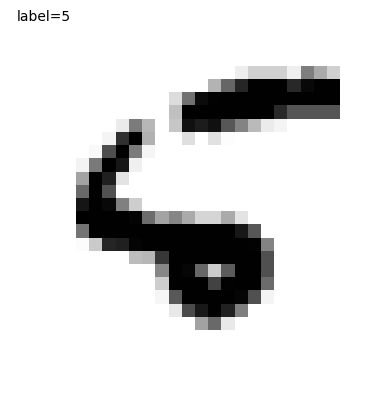

In [ ]:
plt.imshow(x_test[8].reshape(28,28), cmap="gray_r")
plt.axis("off")
plt.text(0,0, f"label={y_test[8]}")
plt.show()

In [ ]:
scores0 = model.decision_function(x_test[:10])
scores0.round(2)

array([[ 2.78, -0.29,  6.18,  7.24,  4.78,  3.86,  0.71,  9.31,  1.76,
         8.27],
       [ 4.19,  2.74,  9.3 ,  7.27,  1.71,  6.27,  8.28, -0.3 ,  5.2 ,
         0.72],
       [-0.3 ,  9.3 ,  7.26,  2.78,  2.79,  1.79,  5.91,  8.24,  4.95,
         1.75],
       [ 9.31, -0.3 ,  5.16,  4.07,  0.72,  7.25,  8.22,  1.81,  2.76,
         6.14],
       [ 3.75, -0.3 ,  7.22,  0.73,  9.3 ,  2.79,  5.1 ,  6.13,  1.75,
         8.29],
       [-0.3 ,  9.31,  7.25,  4.85,  3.78,  1.74,  0.74,  8.26,  6.23,
         2.78],
       [-0.29,  0.72,  1.73,  5.08,  9.3 ,  6.24,  2.74,  7.19,  4.19,
         8.28],
       [-0.3 ,  0.73,  2.78,  5.16,  8.28,  6.2 ,  1.78,  6.2 ,  5.02,
         9.29],
       [ 3.92, -0.28,  9.28,  1.74,  5.2 ,  7.24,  8.26,  0.72,  3.89,
         5.11],
       [ 1.73, -0.29,  3.75,  3.76,  7.28,  3.79,  0.73,  8.29,  6.08,
         9.3 ]])

In [ ]:
class_id = scores0[8].argmax()
class_id

2

In [ ]:
from sklearn.multiclass import OneVsRestClassifier

In [ ]:
ovr_model = OneVsRestClassifier(SVC(random_state=42))
ovr_model.fit(x_train[:2000], y_train[:2000])

OneVsRestClassifier(estimator=SVC(random_state=42))

In [ ]:
y_hat = ovr_model.predict(x_test[:50])
print(y_test[:50] == y_hat)

[ True  True  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True]


In [ ]:
len(ovr_model.estimators_)

10

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

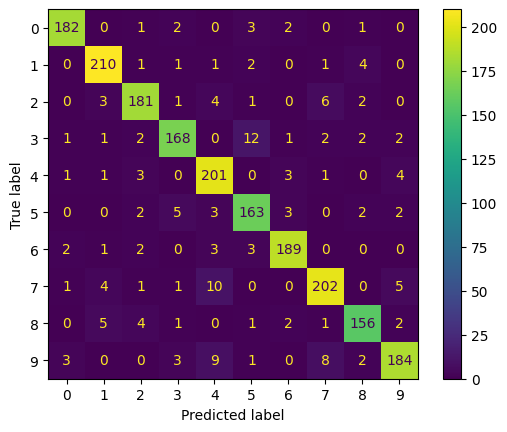

In [ ]:
y_train_hat = cross_val_predict(model, x_train[:2000], y_train[:2000], cv=3)
ConfusionMatrixDisplay.from_predictions(y_train[:2000], y_train_hat)
plt.show()

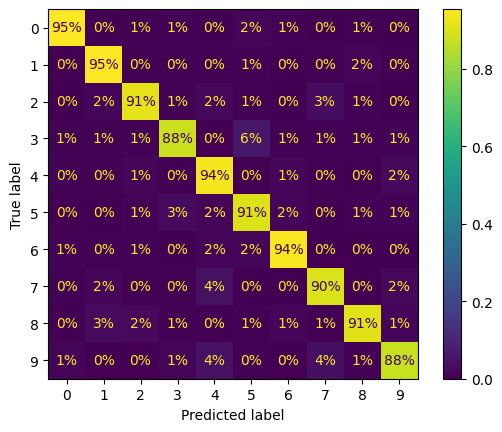

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train[:2000], y_train_hat,
                                        normalize="true", values_format=".0%")
plt.show()

In [ ]:
from sklearn.linear_model import SGDClassifier

In [ ]:
model = SGDClassifier(random_state=42)
model.fit(x_train, y_train)

In [ ]:
model = SGDClassifier(random_state=42)
model.fit(x_train, y_train)

#OTRO

In [ ]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import datasets
import matplotlib.pyplot as plt
import random

In [ ]:
(x_train, y_train), (x_test, y_test) = datasets.mnist.load_data()

11490434/11490434 [==============================] - 0s 0us/step


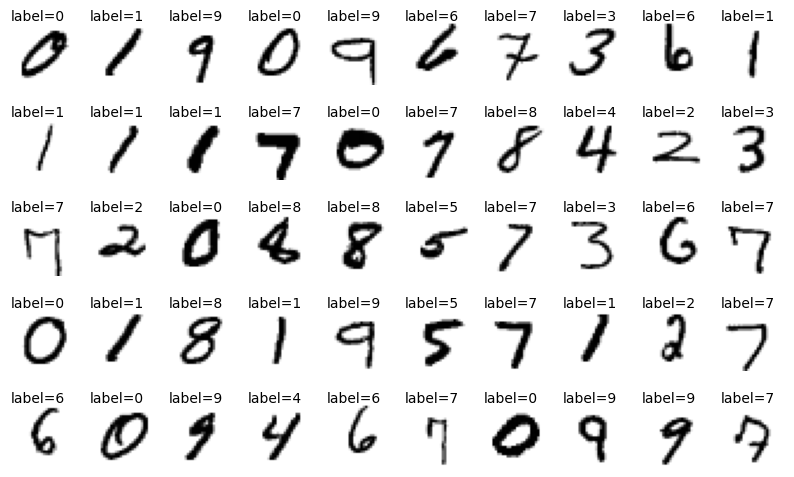

In [ ]:
fig, axs = plt.subplots(5, 10, figsize=(10,6))
m = x_train.shape[0]
for i in range(5):
    for j in range(10):
        idx = random.randint(0,m)
        axs[i,j].imshow(x_train[idx], cmap="gray_r")
        axs[i,j].axis("off")
        axs[i,j].text(0,0, f"label={y_train[idx]}")
        
plt.show()        

In [ ]:
y_train_5 = (y_train == 5)
y_test_5 = (y_test == 5)

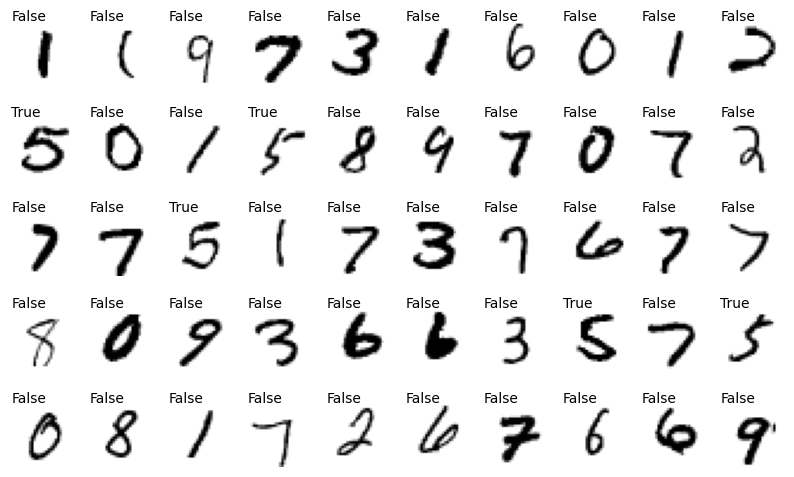

In [ ]:
fig, axs = plt.subplots(5, 10, figsize=(10,6))
m = x_train.shape[0]
for i in range(5):
    for j in range(10):
        idx = random.randint(0,m)
        axs[i,j].imshow(x_train[idx], cmap="gray_r")
        axs[i,j].axis("off")
        axs[i,j].text(0,0, f"{y_train_5[idx]}")
        
plt.show()  

In [ ]:
x_train = x_train.reshape((60000,28*28))
x_test = x_test.reshape((10000,28*28))

In [ ]:
from sklearn.linear_model import SGDClassifier

In [ ]:
model = SGDClassifier(random_state = 42)
model.fit(x_train, y_train_5)

SGDClassifier(random_state=42)

# Cross Validation

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
acc_train = cross_val_score(model, x_train, y_train_5, cv=3, scoring="accuracy")
acc_train

array([0.95035, 0.96035, 0.9604 ])

In [ ]:
acc_test = cross_val_score(model, x_test, y_test_5, cv=3, scoring="accuracy")
acc_test

array([0.95110978, 0.95439544, 0.96879688])

# Confusion Matrix

In [ ]:
from sklearn.model_selection import cross_val_predict

In [ ]:
y_hat = cross_val_predict(model, x_train, y_train_5, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
cm = confusion_matrix(y_train_5, y_hat)
cm

array([[53892,   687],
       [ 1891,  3530]], dtype=int64)

In [ ]:
y_hat = cross_val_predict(model, x_test, y_test_5, cv=3)
cm = confusion_matrix(y_test_5, y_hat)
cm

array([[8936,  172],
       [ 247,  645]], dtype=int64)

# Precision, Recall, F1 Score

Precision = TP / (TP + TP)

Recall = TP / (FN + TP)


In [ ]:
precision = cm[1,1] / (cm[0,1]+cm[1,1])
precision

0.7894736842105263

In [ ]:
cm[1,1] / (cm[1,0] + cm[1,1])

0.7230941704035875

In [ ]:
from sklearn.metrics import precision_recall_curve

In [ ]:
y_scores = cross_val_predict(model, x_test, y_test_5, cv=3,
                            method="decision_function")

In [ ]:
precisions, recalls, thresholds = precision_recall_curve(y_test_5, y_scores)

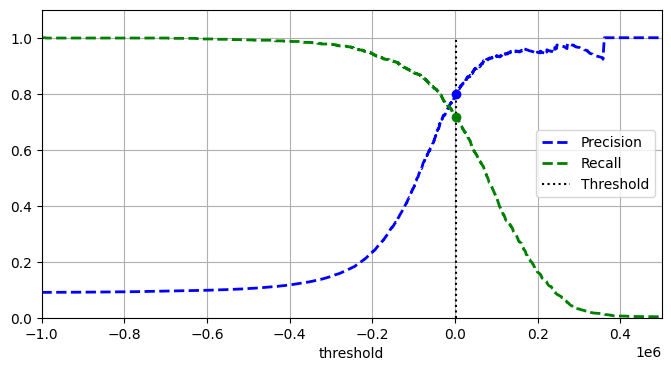

In [ ]:
plt.figure(figsize=(8,4))
plt.plot(thresholds, precisions[:-1], "b--", label="Precision", linewidth=2)
plt.plot(thresholds, recalls[:-1], "g--", label="Recall", linewidth=2)
plt.vlines(3000, 0, 1.0, "k", "dotted", label = "Threshold")

idx = (thresholds >= 3000).argmax()
plt.plot(thresholds[idx], precisions[idx], "bo")
plt.plot(thresholds[idx], recalls[idx], "go")
plt.axis([-1000000, 500000, 0, 1.1])
plt.grid()
plt.xlabel("threshold")
plt.legend(loc="center right")

plt.show()

#KNN

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

In [ ]:
base = "https://raw.githubusercontent.com/lmcanavals/"
base  += "ml/main/data/"

In [ ]:
names = ["sepal length", "sepal width", "petal length", "petal width", "class"]
data = pd.read_csv(f"{base}iris.data", header = None, names=names)
data.head()

,sepal length,sepal width,petal length,petal width,class
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


<AxesSubplot:xlabel='sepal length', ylabel='petal length'>

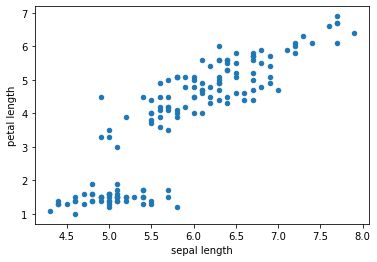

In [ ]:
data.plot(kind="scatter", x="sepal length", y="petal length")

In [ ]:
data[["sepal length"]].shape[1]

1

In [ ]:
class TextIdentifier:
    def __init__(self):
        self._fromText = dict()
        self._fromId = dict()

    def addValues(self, data):
        # Get current size of values as nextId
        nextId = len(self._fromText)

        # Convert to pandas series
        data = data if isinstance(data, pd.Series) else pd.Series(data)

        # For each unique value
        for v in data.unique():
            # If not exsits, add it and upgrade nextId
            if v not in self._fromText:
                self._fromText[v] = nextId
                self._fromId[nextId] = v
                nextId += 1

    def toId(self, data, inplace=False):
        # Check if is a pd.Series
        if isinstance(data, pd.Series):
            # Don't replace the original serie
            return data.replace(self._fromText, inplace=inplace)
        else:
            # Create a serie and replace it
            return pd.Series(data).replace(self._fromText, inplace=True)

    def toText(self, data, inplace=False):
       # Check if is a pd.Series
        if isinstance(data, pd.Series):
            # Don't replace the original serie
            return data.replace(self._fromId, inplace=inplace)
        else:
            # Create a serie and replace it
            return pd.Series(data).replace(self._fromId, inplace=True)


In [ ]:
class PandasDistances:
    # Euclidean distance: sqrt(Σ|(Xi-Yi)^2|)
    @staticmethod
    def Euclidean(X, Y):
        res = (X - Y) ** 2 # (Xi-Yi)^2
        return np.sqrt(res.sum(axis = 1))

    # Manhattan Distance: Σ|Xi – Yi|
    @staticmethod
    def Manhattan(X, Y):
        res = np.abs(X - Y) # |Xi – Yi|
        return res.sum(axis = 1)

    # Angle Distance [rad]: cos[alpha] = dot(X,Y) / ||X||*||Y||
    @staticmethod
    def Angle(X, Y):
        dot = X.dot(Y)
        xMag = np.sqrt((X ** 2).sum(axis=1))
        yMag = np.sqrt(np.power(Y, 2).sum())
        return np.arccos(dot / (xMag*yMag))

    # Angle Distance [deg]: rad2deg(Angle(X,Y))
    @staticmethod
    def AngleDegrees(X, Y):
        return np.rad2deg(Angle(X, Y))

In [ ]:
class KNN:
    # Constructor
    def __init__(self, distAlg = None, k = None):
        # Model algorithm variables
        self._distAlg = distAlg if distAlg is not None else PandasDistances.Euclidean
        self._k = k if k is not None else 5

        # Model data variables
        self._points = None

    def train(self, points, labels):
        # Should save the points as dataset to make more easier
        self._points = pd.DataFrame(points, columns=None, copy=True)
        self._points.columns = np.arange(self._points.shape[1])

        # if labels is a DataFrame, get the Serie
        if isinstance(labels, pd.DataFrame):
            labels = labels[labels.columns[0]]

        # Add label to final in points
        self._points["_label"] = pd.Series(labels, copy=True)
        
        # Reset index
        self._points = self._points.reset_index(drop=True)

        # Return instance
        return self

    def nearestNeighbors(self, point, distAlg = None, k = None):
        k = k if k is not None else self._k
        distAlg = distAlg if distAlg is not None else self._distAlg

        # drop the _label
        trainPoints = self._points.drop(["_label"], axis=1)

        # Compute the distances over training points and sort it
        distances = distAlg(trainPoints, point)
        distances.sort_values(inplace=True, ascending=True)
        
        # Make a k kut if k>0
        distances = distances[0:k] if k > 0 else distances
        
        # Return points
        return self._points.iloc[distances.index.values]

    def predict(self, data, distAlg = None, k = None):
        k = k if k is not None else self._k
        distAlg = distAlg if distAlg is not None else self._distAlg
        data = data if isinstance(data, np.ndarray) is True else np.asarray(data)

        # Get the nearestNeighbors
        nn = self.nearestNeighbors(data, distAlg=distAlg, k=k)

        # Get the labels
        labels = nn["_label"]

        # If the labels are numbers, use the mean
        # Types: i int (signed), u unsigned int, f float, c complex.
        #if labels.dtype.kind in "iufc":
        #    return labels.mean()

        # If is other types, the most frecuent
        return labels.value_counts(sort = True).index[0]

In [ ]:
knn = KNN()

y = data[["class"]]
x = data[["sepal length", "petal length"]]


knn.train(x, y)

def calc(pt):
    print(pt)
    print("Euclidean:", knn.predict(pt, distAlg=PandasDistances.Euclidean))
    print("Manhattan:", knn.predict(pt, distAlg=PandasDistances.Manhattan))
    print("Angle    :", knn.predict(pt, distAlg=PandasDistances.Angle))
    print("")

calc([5.5,3])
calc([7,5])

[5.5, 3]
Euclidean: Iris-versicolor
Manhattan: Iris-versicolor
Angle    : Iris-versicolor

[7, 5]
Euclidean: Iris-versicolor
Manhattan: Iris-versicolor
Angle    : Iris-versicolor



In [ ]:
knn.nearestNeighbors([8, 1], distAlg=PandasDistances.Manhattan)

,0,1,_label
14,5.8,1.2,Iris-setosa
36,5.5,1.3,Iris-setosa
15,5.7,1.5,Iris-setosa
16,5.4,1.3,Iris-setosa
33,5.5,1.4,Iris-setosa


In [ ]:
# Split train / test
df_train = data.sample(frac=0.8, random_state=200)
df_test  = data.drop(df_train.index)

# KNN
knn = KNN()

# Split X and Y
df_train_y = df_train[["class"]]
df_train_x = df_train.drop(["class"], axis=1)

# Train
knn.train(df_train_x, df_train_y)

# Separate each class
df_test_y = df_test[["class"]]
df_test_x = df_test.drop(["class"], axis=1)

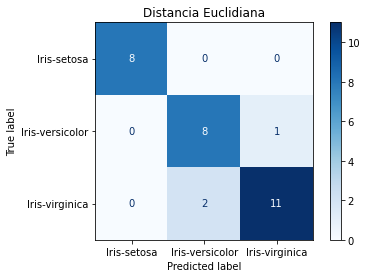

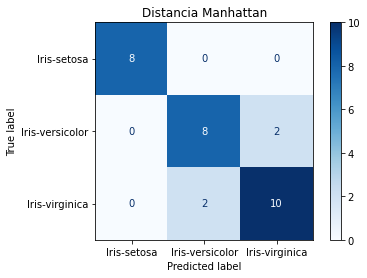

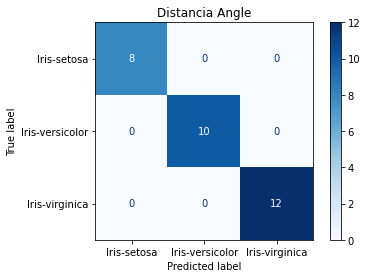

In [ ]:
# labels
display_labels = df_test_y["class"].unique()

# Generar matrices de confucion [Euclidiana]
preditected_vals = [knn.predict(row, distAlg=PandasDistances.Euclidean) for _, row in df_test_x.iterrows()]
matrix_vals = confusion_matrix(preditected_vals, df_test_y)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("Distancia Euclidiana")
plt.show()

#" Generar matrices de confucion [Manhattan]
preditected_vals = [knn.predict(row, distAlg=PandasDistances.Manhattan) for _, row in df_test_x.iterrows()]
matrix_vals = confusion_matrix(preditected_vals, df_test_y)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("Distancia Manhattan")
plt.show()

# Generar matrices de confucion [Angle]
preditected_vals = [knn.predict(row, distAlg=PandasDistances.Angle) for _, row in df_test_x.iterrows()]
matrix_vals = confusion_matrix(preditected_vals, df_test_y)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("Distancia Angle")
plt.show()

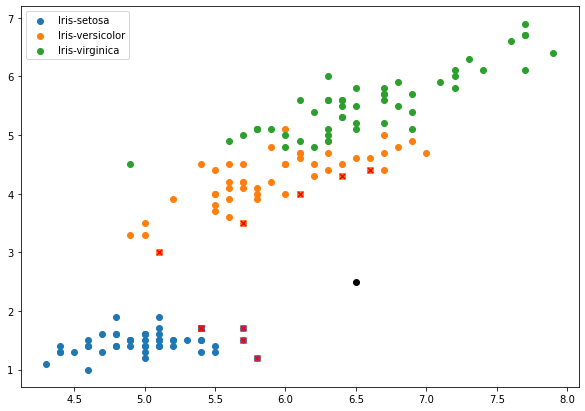

In [ ]:
df_points = data[["sepal length", "petal length"]]
df_points_class = data["class"]

knn2 = KNN()
knn2.train(df_points, df_points_class)
display_labels = data["class"].unique()

fig, ax = plt.subplots(figsize=(10, 7))
#plt.figure()
for label in display_labels:
    df_grp = df_points[df_points_class == label]
    ax.scatter(df_grp["sepal length"], df_grp["petal length"], label = label)

# KNN
p_data = [6.5, 2]
p_data = [6.5, 2.5]
p_knn = knn2.nearestNeighbors(p_data, k=10, distAlg = PandasDistances.Manhattan)
#p_knn = df_points.iloc[p_dots]

ax.scatter(p_data[0], p_data[1], color = "black")
ax.scatter(p_knn[0], p_knn[1], marker="x", facecolor="red")

    
ax.legend()
plt.show()

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

data = load_breast_cancer()
X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.3, random_state=42)


In [ ]:
knn_bc = KNN()
knn_bc.train(X_train, y_train)

In [ ]:
np.array(preditected_vals)

array([0.6, 0. , 0. , 1. , 1. , 0. , 0. , 0.2, 1. , 1. , 1. , 0. , 0.8,
       0.6, 1. , 0. , 0.6, 1. , 1. , 0. , 0.6, 1. , 0. , 1. , 1. , 1. ,
       1. , 1. , 1. , 0. , 1. , 1. , 1. , 0.6, 1. , 1. , 0. , 1. , 0. ,
       0.8, 1. , 0. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 1. , 0. , 0. ,
       1. , 1. , 1. , 1. , 1. , 0. , 0.6, 1. , 1. , 0. , 0. , 0.6, 1. ,
       1. , 0. , 0. , 1. , 1. , 0.6, 0. , 1. , 0.6, 1. , 1. , 1. , 0.4,
       1. , 1. , 0. , 1. , 0.6, 0. , 0. , 0.2, 0.2, 0. , 1. , 1. , 1. ,
       1. , 0.8, 1. , 1. , 1. , 0. , 0. , 1. , 0. , 0. , 1. , 0. , 0. ,
       0.6, 1. , 1. , 0. , 0.8, 0.8, 0. , 1. , 0.8, 0. , 1. , 0. , 1. ,
       1. , 1. , 0. , 0.8, 1. , 1. , 0. , 1. , 0. , 0. , 1. , 1. , 0. ,
       0. , 0.4, 0.6, 1. , 0.4, 0. , 1. , 1. , 0.6, 0. , 1. , 0. , 1. ,
       1. , 0.4, 1. , 0. , 0. , 0. , 1. , 0. , 1. , 1. , 1. , 1. , 0. ,
       0. , 1. , 0.6, 1. , 1. , 1. , 1. , 1. , 0.4, 1. , 1. , 1. , 1. ,
       0.2, 1. ])

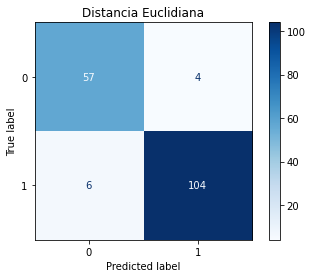

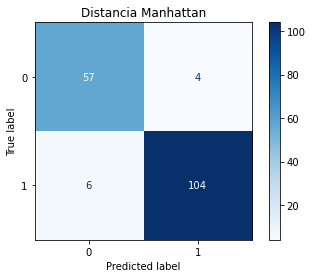

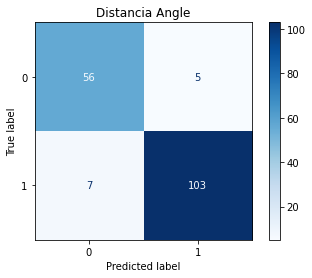

In [ ]:
# labels
display_labels = [0, 1]
k_bc = 3

# Generar matrices de confucion [Euclidiana]
preditected_vals = [knn_bc.predict(row, distAlg=PandasDistances.Euclidean, k = k_bc) for row in X_test]
matrix_vals = confusion_matrix(preditected_vals, y_test)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("Distancia Euclidiana")
plt.show()

# Generar matrices de confucion [Manhattan]
preditected_vals = [knn_bc.predict(row, distAlg=PandasDistances.Manhattan, k = k_bc) for row in X_test]
matrix_vals = confusion_matrix(preditected_vals, y_test)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("Distancia Manhattan")
plt.show()

# Generar matrices de confucion [Angle]
preditected_vals = [knn_bc.predict(row, distAlg=PandasDistances.Angle, k = k_bc) for row in X_test]
matrix_vals = confusion_matrix(preditected_vals, y_test)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("Distancia Angle")
plt.show()

Accuracy: 0.9415204678362573


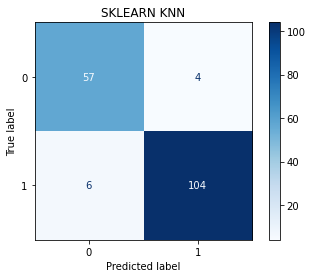

Accuracy: 0.9590643274853801


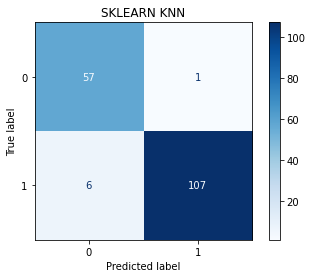

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
accuracy = knn.score(X_test, y_test)
print("Accuracy:", accuracy)

preditected_vals = y_pred
matrix_vals = confusion_matrix(preditected_vals, y_test)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("SKLEARN KNN")
plt.show()

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
accuracy = knn.score(X_test, y_test)
print("Accuracy:", accuracy)

preditected_vals = y_pred
matrix_vals = confusion_matrix(preditected_vals, y_test)
ConfusionMatrixDisplay(confusion_matrix=matrix_vals, display_labels=display_labels).plot(cmap=plt.cm.Blues)
plt.title("SKLEARN KNN")
plt.show()

In [ ]:
knn_sklearn = KNeighborsClassifier(n_neighbors=3)
knn_sklearn.fit(X_train, y_train)
%time knn.predict(X_test)

CPU times: user 31.3 ms, sys: 19.5 ms, total: 50.8 ms
Wall time: 18.9 ms


array([1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1])

In [ ]:
knn_me = KNN(k=3)
knn_me.train(X_train, y_train)
%time [knn_bc.predict(row, distAlg=PandasDistances.Euclidean, k = k_bc) for row in X_test]

CPU times: user 135 ms, sys: 6.91 ms, total: 142 ms
Wall time: 159 ms


[0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1]